# Wetterskip

### Create shortest_path RHWS network

Code is based on: https://github.com/Deltares/Ribasim-NL/blob/1ad35931f49280fe223cbd9409e321953932a3a4/notebooks/ijsselmeermodel/netwerk.py#L55


In [13]:
import fiona
import geopandas as gpd
import matplotlib.pyplot as plt
import networkx as nx
import numpy as np
import pandas as pd
import shapely
import tqdm.auto as tqdm
from shapely.geometry import LineString, MultiLineString, Point
from shapely.ops import split
from shapely.wkt import dumps

### Load Data

In [14]:
waterschap = "Wetterskip"

# Define crossings file path
path2json = "/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/waterschappen.json"
data_path_str = pd.read_json(path2json).loc["init"][waterschap]["output_path"]
data_path = f"/DATAFOLDER/projects/4750_30/{data_path_str.split('../')[-1]}"


# Load crossings file
DATA = {L: gpd.read_file(data_path, layer=L) for L in fiona.listlayers(data_path)}

### Select rhws

In [15]:
# Select RHWS peilgebeied & calculate representative point
gdf_rhws = DATA["peilgebied"].loc[DATA["peilgebied"]["peilgebied_cat"] == 1].copy()
gdf_rhws["representative_point"] = gdf_rhws.representative_point()

# Apply aggregation level based filter
gdf_cross = (
    DATA["crossings_hydroobject_filtered"].loc[DATA["crossings_hydroobject_filtered"]["agg_links_in_use"]].copy()
)  # filter aggregation level

### Define functions
1. splitting functions
2. connect graphs functions
3. explode nodes functions

In [16]:
def split_line_at_point(line, point):
    buff = point.buffer(1e-4)  # Small buffer around the point
    split_result = split(line, buff)
    if len(split_result.geoms) in [2, 3]:
        # Assume first and last segments are the result, ignore tiny middle segment if exists
        result = MultiLineString([split_result.geoms[0], split_result.geoms[-1]])
    else:
        # Return the original line as a MultiLineString for consistency if no split occurred
        result = MultiLineString([line])
    return result


def split_lines_at_intersections(gdf_object):
    split_lines = []
    gdf_object.drop(columns=["geometry"])  # Preserve non-geometry attributes

    for idx, row in gdf_object.iterrows():
        was_split = False

        # Get potential intersections using spatial index
        possible_matches_index = list(gdf_object.sindex.intersection(row.geometry.bounds))
        possible_matches = gdf_object.iloc[possible_matches_index].drop(idx)  # Exclude self
        precise_matches = possible_matches[possible_matches.intersects(row.geometry)]

        for match_idx, match in precise_matches.iterrows():
            if row.geometry.intersects(match.geometry):
                intersection = row.geometry.intersection(match.geometry)
                if isinstance(intersection, Point):
                    # Split the current line at the intersection point
                    try:
                        split_result = split_line_at_point(row.geometry, intersection)
                        for geom in split_result.geoms:
                            new_row = row.copy()
                            new_row.geometry = geom
                            split_lines.append(new_row)
                        was_split = True
                    except ValueError as e:
                        print(f"Error splitting line: {e}")
                # Add other intersection types handling if needed
                break  # Assumes only one split per line; remove or modify for multiple splits

        if not was_split:
            # If the line was not split, include the original line
            split_lines.append(row)

    # Create a new GeoDataFrame from the split or original lines
    result_gdf = gpd.GeoDataFrame(split_lines, columns=gdf_object.columns)
    return result_gdf


def component_to_gdf(component, node_geometries):
    geometries = [node_geometries[node] for node in component]
    return gpd.GeoDataFrame(geometry=geometries, index=list(component))


def connect_components(graph, node1, node2, node_geometries):
    geom1 = node_geometries[node1]
    geom2 = node_geometries[node2]
    new_edge_geom = LineString([geom1.coords[0], geom2.coords[0]])
    graph.add_edge(node1, node2, geometry=new_edge_geom)


def find_closest_component_pair(largest_gdf, smaller_gdfs):
    print(len(smaller_gdfs), end="\r")
    sgdf = gpd.GeoSeries([shapely.geometry.MultiPoint(small_gdf.geometry.tolist()) for small_gdf in smaller_gdfs])
    nearest_i, dist2 = sgdf.sindex.nearest(largest_gdf.geometry, return_all=False, return_distance=True)
    li, si = nearest_i[:, np.argmin(dist2)]

    nearest_idx, dist = smaller_gdfs[si].sindex.nearest(
        largest_gdf.geometry.iat[li], return_all=False, return_distance=True
    )
    node_in_smaller = smaller_gdfs[si].index[nearest_idx[1, 0]]
    node_in_largest = largest_gdf.index[li]
    closest_pair_nodes = (node_in_largest, node_in_smaller)
    # print("done")
    return si, closest_pair_nodes


def cut_linestring_at_interval(line, interval):
    """Cut a LineString into segments of a specified interval."""
    # Calculate the number of segments needed
    num_segments = int(np.ceil(line.length / interval))
    if num_segments == 1:
        return [line]

    points = [line.interpolate(distance) for distance in np.linspace(0, line.length, num_segments + 1)]
    return [LineString([points[i], points[i + 1]]) for i in range(num_segments)]


def explode_linestrings(gdf, interval):
    """Explode LineStrings in a GeoDataFrame into smaller segments based on a distance interval."""
    segments = []
    for _, row in gdf.iterrows():
        line = row.geometry
        segments.extend(cut_linestring_at_interval(line, interval))

    return gpd.GeoDataFrame(geometry=segments, crs=gdf.crs)


def connect_linestrings_within_distance(gdf, max_distance=4):
    gdf = gdf.explode(ignore_index=False, index_parts=True)
    gdf["geometry"] = gdf.make_valid()
    gdf["geometry"] = gdf.geometry.apply(shapely.force_2d)
    gdf = gdf[~gdf.is_empty].copy()

    change_idx, change_geom = [], []
    for row in tqdm.tqdm(
        gdf.itertuples(),
        total=len(gdf),
    ):
        ps = row.geometry.boundary.geoms
        if len(ps) != 2:
            continue
        p0, p1 = ps

        p0_changed, p1_changed = False, False
        idx0 = gdf.sindex.query(p0.buffer(max_distance), predicate="intersects")
        if len(idx0) > 0:
            dist0 = gdf.iloc[idx0].distance(p0)
            if (dist0 > 10e-8).any():
                snap_lbl0 = dist0[dist0 > 10e-8].idxmin()
                geom = gdf.geometry.at[snap_lbl0]
                p0 = geom.interpolate(geom.project(p0))
                p0_changed = True

        idx1 = gdf.sindex.query(p1.buffer(max_distance), predicate="intersects")
        if len(idx1) > 0:
            dist1 = gdf.iloc[idx1].distance(p1)
            if (dist1 > 10e-8).any():
                snap_lbl1 = dist1[dist1 > 10e-8].idxmin()
                geom = gdf.geometry.at[snap_lbl1]
                p1 = geom.interpolate(geom.project(p1))
                p1_changed = True

        if p0_changed or p1_changed:
            coords = list(row.geometry.coords)
            if p0_changed:
                coords = list(p0.coords) + coords
            if p1_changed:
                coords = coords + list(p1.coords)
            change_idx.append(row.Index)
            change_geom.append(LineString(coords))

    if len(change_idx) > 0:
        gdf.loc[change_idx, "geometry"] = change_geom

    return gdf

# Shortest Path

  0%|          | 0/336 [00:00<?, ?it/s]

0
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/12 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_0_new.png'
1
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


0it [00:00, ?it/s]

Create NetworkX
index 0 is out of bounds for axis 1 with size 0
2
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/86 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_2_new.png'
3
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/1 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_3_new.png'
4
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/14 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_4_new.png'
5
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/8 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_5_new.png'
6
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


/tmp/ipykernel_6560/18917213.py:210: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  gdf_cross_single.plot(ax=ax, color="orange", label="crossings")
/tmp/ipykernel_6560/18917213.py:211: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  plt_paths.plot(ax=ax, color="purple", label="shortest paths")


  0%|          | 0/12 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_6_new.png'
7
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/42 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_7_new.png'
8
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/11 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_8_new.png'
9
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/35 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_9_new.png'
10
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/416 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_10_new.png'
11
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


0it [00:00, ?it/s]

Create NetworkX
index 0 is out of bounds for axis 1 with size 0
12
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/4 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_12_new.png'
13
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/1044 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_13_new.png'
14
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/305 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_14_new.png'
15
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/5 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_15_new.png'
16
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/1 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_16_new.png'
17
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/86 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_17_new.png'
18
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/6 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_18_new.png'
19
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/160 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_19_new.png'
20
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/68 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_20_new.png'
21
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/40 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_21_new.png'
22
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/371 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output


/tmp/ipykernel_6560/18917213.py:201: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(8, 8))


[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_22_new.png'
23
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/3 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_23_new.png'
24
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/506 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_24_new.png'
25
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/18 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_25_new.png'
26
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/30 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_26_new.png'
27
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/12 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_27_new.png'
28
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/9 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_28_new.png'
29
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


/tmp/ipykernel_6560/18917213.py:210: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  gdf_cross_single.plot(ax=ax, color="orange", label="crossings")
/tmp/ipykernel_6560/18917213.py:211: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  plt_paths.plot(ax=ax, color="purple", label="shortest paths")


  0%|          | 0/11 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_29_new.png'
30
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


0it [00:00, ?it/s]

Create NetworkX
index 0 is out of bounds for axis 1 with size 0
31
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/147 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_31_new.png'
32
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/706 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_32_new.png'
33
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/49 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_33_new.png'
34
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/8 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_34_new.png'
35
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/11 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_35_new.png'
36
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/18 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_36_new.png'
37
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/10 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_37_new.png'
38
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/2593 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_38_new.png'
39
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/66 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_39_new.png'
40
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/56 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_40_new.png'
41
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/2717 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_41_new.png'
42
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/21 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_42_new.png'
43
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/28 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_43_new.png'
44
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/12 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_44_new.png'
45
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


0it [00:00, ?it/s]

Create NetworkX
index 0 is out of bounds for axis 1 with size 0
46
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/46 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_46_new.png'
47
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/76 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_47_new.png'
48
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


0it [00:00, ?it/s]

Create NetworkX
index 0 is out of bounds for axis 1 with size 0
49
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


0it [00:00, ?it/s]

Create NetworkX
index 0 is out of bounds for axis 1 with size 0
50
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/8 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_50_new.png'
51
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/171 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_51_new.png'
52
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/1 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_52_new.png'
53
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/17 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_53_new.png'
54
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/992 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_54_new.png'
55
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/4 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_55_new.png'
56
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/59 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_56_new.png'
57
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/25 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_57_new.png'
58
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/5 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_58_new.png'
59
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/14 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_59_new.png'
60
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/59 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_60_new.png'
61
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/11 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_61_new.png'
62
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/43 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_62_new.png'
63
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


0it [00:00, ?it/s]

Create NetworkX
index 0 is out of bounds for axis 1 with size 0
64
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/186 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_64_new.png'
65
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/300 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_65_new.png'
66
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/9 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_66_new.png'
67
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/2 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_67_new.png'
68
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/19 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_68_new.png'
69
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


/tmp/ipykernel_6560/18917213.py:210: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  gdf_cross_single.plot(ax=ax, color="orange", label="crossings")
/tmp/ipykernel_6560/18917213.py:211: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  plt_paths.plot(ax=ax, color="purple", label="shortest paths")


  0%|          | 0/7 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_69_new.png'
70
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/1 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_70_new.png'
71
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


0it [00:00, ?it/s]

Create NetworkX
index 0 is out of bounds for axis 1 with size 0
72
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/16 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_72_new.png'
73
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/700 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_73_new.png'
74
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/605 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_74_new.png'
75
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/6 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_75_new.png'
76
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/2 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_76_new.png'
77
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


/tmp/ipykernel_6560/18917213.py:210: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  gdf_cross_single.plot(ax=ax, color="orange", label="crossings")
/tmp/ipykernel_6560/18917213.py:211: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  plt_paths.plot(ax=ax, color="purple", label="shortest paths")


  0%|          | 0/8 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_77_new.png'
78
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/7 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_78_new.png'
79
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/37 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_79_new.png'
80
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/2 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_80_new.png'
81
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/540 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_81_new.png'
82
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/6 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_82_new.png'
83
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


0it [00:00, ?it/s]

Create NetworkX
index 0 is out of bounds for axis 1 with size 0
84
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/7 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_84_new.png'
85
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/1 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_85_new.png'
86
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


0it [00:00, ?it/s]

Create NetworkX
index 0 is out of bounds for axis 1 with size 0
87
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/17 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_87_new.png'
88
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/192 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_88_new.png'
89
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/293 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_89_new.png'
90
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/230 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_90_new.png'
91
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/320 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_91_new.png'
92
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/4 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_92_new.png'
93
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/393 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_93_new.png'
94
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/414 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_94_new.png'
95
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


0it [00:00, ?it/s]

Create NetworkX
index 0 is out of bounds for axis 1 with size 0
96
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/15 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_96_new.png'
97
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/26 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_97_new.png'
98
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/100 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_98_new.png'
99
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/122 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_99_new.png'
100
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/187 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_100_new.png'
101
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/4 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_101_new.png'
102
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/9 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_102_new.png'
103
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/19 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_103_new.png'
104
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


0it [00:00, ?it/s]

Create NetworkX
index 0 is out of bounds for axis 1 with size 0
105
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/13 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_105_new.png'
106
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/1600 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_106_new.png'
107
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/15 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_107_new.png'
108
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/368 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_108_new.png'
109
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/18 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_109_new.png'
110
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/4 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_110_new.png'
111
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/6 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_111_new.png'
112
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/16 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_112_new.png'
113
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


0it [00:00, ?it/s]

Create NetworkX
index 0 is out of bounds for axis 1 with size 0
114
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/4 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_114_new.png'
115
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/94 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_115_new.png'
116
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/26 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_116_new.png'
117
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/1 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_117_new.png'
118
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


/tmp/ipykernel_6560/18917213.py:210: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  gdf_cross_single.plot(ax=ax, color="orange", label="crossings")
/tmp/ipykernel_6560/18917213.py:211: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  plt_paths.plot(ax=ax, color="purple", label="shortest paths")


0it [00:00, ?it/s]

Create NetworkX
index 0 is out of bounds for axis 1 with size 0
119
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/983 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_119_new.png'
120
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/145 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_120_new.png'
121
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/290 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_121_new.png'
122
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/20 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_122_new.png'
123
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/804 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_123_new.png'
124
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


0it [00:00, ?it/s]

Create NetworkX
index 0 is out of bounds for axis 1 with size 0
125
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/12 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_125_new.png'
126
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/3 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_126_new.png'
127
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/589 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_127_new.png'
128
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/2 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_128_new.png'
129
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/391 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_129_new.png'
130
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/140 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_130_new.png'
131
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/84 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_131_new.png'
132
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/500 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_132_new.png'
133
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/1 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_133_new.png'
134
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


/tmp/ipykernel_6560/18917213.py:210: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  gdf_cross_single.plot(ax=ax, color="orange", label="crossings")
/tmp/ipykernel_6560/18917213.py:211: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  plt_paths.plot(ax=ax, color="purple", label="shortest paths")


  0%|          | 0/6 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_134_new.png'
135
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/3 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_135_new.png'
136
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


0it [00:00, ?it/s]

Create NetworkX
index 0 is out of bounds for axis 1 with size 0
137
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/890 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_137_new.png'
138
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/787 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_138_new.png'
139
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/17 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_139_new.png'
140
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/18 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_140_new.png'
141
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/12 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_141_new.png'
142
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/263 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_142_new.png'
143
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/1 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_143_new.png'
144
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/9 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_144_new.png'
145
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/90 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_145_new.png'
146
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/23 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_146_new.png'
147
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/4 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_147_new.png'
148
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/95 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_148_new.png'
149
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/7 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_149_new.png'
150
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/2 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_150_new.png'
151
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/5 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_151_new.png'
152
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/239 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_152_new.png'
153
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/2 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_153_new.png'
154
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/1 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_154_new.png'
155
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/1121 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_155_new.png'
156
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/8 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_156_new.png'
157
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/62 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_157_new.png'
158
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/3 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_158_new.png'
159
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/6 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_159_new.png'
160
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/48 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_160_new.png'
161
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/10 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_161_new.png'
162
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/77 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_162_new.png'
163
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/270 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_163_new.png'
164
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/13 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_164_new.png'
165
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/84 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_165_new.png'
166
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/714 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_166_new.png'
167
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/3 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_167_new.png'
168
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/372 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_168_new.png'
169
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/42 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_169_new.png'
170
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/8 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_170_new.png'
171
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/14 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_171_new.png'
172
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/188 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_172_new.png'
173
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


0it [00:00, ?it/s]

Create NetworkX
index 0 is out of bounds for axis 1 with size 0
174
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/35 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_174_new.png'
175
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/10 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_175_new.png'
176
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/4 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_176_new.png'
177
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/175 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_177_new.png'
178
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/12 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_178_new.png'
179
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/3 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_179_new.png'
180
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/16 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_180_new.png'
181
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/149 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_181_new.png'
182
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/6 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_182_new.png'
183
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


0it [00:00, ?it/s]

Create NetworkX
index 0 is out of bounds for axis 1 with size 0
184
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/799 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_184_new.png'
185
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


0it [00:00, ?it/s]

Create NetworkX
index 0 is out of bounds for axis 1 with size 0
186
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/2 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_186_new.png'
187
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


0it [00:00, ?it/s]

Create NetworkX
index 0 is out of bounds for axis 1 with size 0
188
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/838 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_188_new.png'
189
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/9 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_189_new.png'
190
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/4 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_190_new.png'
191
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/729 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_191_new.png'
192
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/226 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_192_new.png'
193
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/17 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_193_new.png'
194
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/1 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_194_new.png'
195
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/9 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_195_new.png'
196
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/39 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_196_new.png'
197
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/46 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_197_new.png'
198
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/3 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_198_new.png'
199
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/2 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_199_new.png'
200
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/8 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_200_new.png'
201
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/4 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_201_new.png'
202
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/19 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_202_new.png'
203
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/13 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_203_new.png'
204
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/718 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_204_new.png'
205
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/91 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_205_new.png'
206
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/41 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_206_new.png'
207
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/1968 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_207_new.png'
208
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/2 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_208_new.png'
209
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


0it [00:00, ?it/s]

Create NetworkX
index 0 is out of bounds for axis 1 with size 0
210
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


0it [00:00, ?it/s]

Create NetworkX
index 0 is out of bounds for axis 1 with size 0
211
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/1283 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_211_new.png'
212
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/1 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_212_new.png'
213
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/33 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_213_new.png'
214
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


0it [00:00, ?it/s]

Create NetworkX
index 0 is out of bounds for axis 1 with size 0
215
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/44 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_215_new.png'
216
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/2 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_216_new.png'
217
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/13 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_217_new.png'
218
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/340 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_218_new.png'
219
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/157 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_219_new.png'
220
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/706 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_220_new.png'
221
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/280 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_221_new.png'
222
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/20 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_222_new.png'
223
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/1068 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_223_new.png'
224
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


0it [00:00, ?it/s]

Create NetworkX
index 0 is out of bounds for axis 1 with size 0
225
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/30 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_225_new.png'
226
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/7 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_226_new.png'
227
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


0it [00:00, ?it/s]

Create NetworkX
index 0 is out of bounds for axis 1 with size 0
228
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


0it [00:00, ?it/s]

Create NetworkX
index 0 is out of bounds for axis 1 with size 0
229
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


0it [00:00, ?it/s]

Create NetworkX
index 0 is out of bounds for axis 1 with size 0
230
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/2 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_230_new.png'
231
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


0it [00:00, ?it/s]

Create NetworkX
index 0 is out of bounds for axis 1 with size 0
232
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/29 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_232_new.png'
233
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/569 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_233_new.png'
234
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/154 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_234_new.png'
235
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/59 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_235_new.png'
236
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/103 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_236_new.png'
237
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/549 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_237_new.png'
238
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/755 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_238_new.png'
239
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/160 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_239_new.png'
240
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/35 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_240_new.png'
241
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


0it [00:00, ?it/s]

Create NetworkX
index 0 is out of bounds for axis 1 with size 0
242
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/202 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_242_new.png'
243
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/312 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_243_new.png'
244
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/269 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_244_new.png'
245
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/128 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_245_new.png'
246
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/1 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_246_new.png'
247
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/413 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_247_new.png'
248
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


0it [00:00, ?it/s]

Create NetworkX
index 0 is out of bounds for axis 1 with size 0
249
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/14 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_249_new.png'
250
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/1 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_250_new.png'
251
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


/tmp/ipykernel_6560/18917213.py:210: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  gdf_cross_single.plot(ax=ax, color="orange", label="crossings")
/tmp/ipykernel_6560/18917213.py:211: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  plt_paths.plot(ax=ax, color="purple", label="shortest paths")


  0%|          | 0/83 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_251_new.png'
252
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/8 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_252_new.png'
253
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/7 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_253_new.png'
254
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


/tmp/ipykernel_6560/18917213.py:210: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  gdf_cross_single.plot(ax=ax, color="orange", label="crossings")
/tmp/ipykernel_6560/18917213.py:211: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  plt_paths.plot(ax=ax, color="purple", label="shortest paths")


0it [00:00, ?it/s]

Create NetworkX
Length of values (0) does not match length of index (1)
255
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/1 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_255_new.png'
256
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/1 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_256_new.png'
257
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/382 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_257_new.png'
258
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/3 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_258_new.png'
259
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/18 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_259_new.png'
260
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/15 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_260_new.png'
261
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/423 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_261_new.png'
262
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/643 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_262_new.png'
263
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/21 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_263_new.png'
264
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/14 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_264_new.png'
265
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/3 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_265_new.png'
266
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/24 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_266_new.png'
267
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/135 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_267_new.png'
268
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/27 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_268_new.png'
269
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


0it [00:00, ?it/s]

Create NetworkX
index 0 is out of bounds for axis 1 with size 0
270
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


0it [00:00, ?it/s]

Create NetworkX
index 0 is out of bounds for axis 1 with size 0
271
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/33 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_271_new.png'
272
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


0it [00:00, ?it/s]

Create NetworkX
index 0 is out of bounds for axis 1 with size 0
273
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/16 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_273_new.png'
274
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/33 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_274_new.png'
275
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/31 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_275_new.png'
276
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/47 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_276_new.png'
277
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/11 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_277_new.png'
278
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/1 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_278_new.png'
279
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


/tmp/ipykernel_6560/18917213.py:210: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  gdf_cross_single.plot(ax=ax, color="orange", label="crossings")
/tmp/ipykernel_6560/18917213.py:211: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  plt_paths.plot(ax=ax, color="purple", label="shortest paths")


  0%|          | 0/422 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_279_new.png'
280
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


0it [00:00, ?it/s]

Create NetworkX
index 0 is out of bounds for axis 1 with size 0
281
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


0it [00:00, ?it/s]

Create NetworkX
index 0 is out of bounds for axis 1 with size 0
282
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/57 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_282_new.png'
283
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/28 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_283_new.png'
284
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/25 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_284_new.png'
285
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/16 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_285_new.png'
286
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/108 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_286_new.png'
287
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/3 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_287_new.png'
288
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/4 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_288_new.png'
289
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


0it [00:00, ?it/s]

Create NetworkX
index 0 is out of bounds for axis 1 with size 0
290
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/47 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_290_new.png'
291
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


0it [00:00, ?it/s]

Create NetworkX
index 0 is out of bounds for axis 1 with size 0
292
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/1689 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_292_new.png'
293
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/61 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_293_new.png'
294
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


0it [00:00, ?it/s]

Create NetworkX
index 0 is out of bounds for axis 1 with size 0
295
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/41 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_295_new.png'
296
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/190 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_296_new.png'
297
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/1 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_297_new.png'
298
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


0it [00:00, ?it/s]

Create NetworkX
index 0 is out of bounds for axis 1 with size 0
299
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


0it [00:00, ?it/s]

Create NetworkX
index 0 is out of bounds for axis 1 with size 0
300
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/100 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_300_new.png'
301
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/1 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_301_new.png'
302
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/181 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_302_new.png'
303
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/1 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_303_new.png'
304
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/17 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_304_new.png'
305
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/4 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_305_new.png'
306
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


/tmp/ipykernel_6560/18917213.py:210: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  gdf_cross_single.plot(ax=ax, color="orange", label="crossings")
/tmp/ipykernel_6560/18917213.py:211: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  plt_paths.plot(ax=ax, color="purple", label="shortest paths")


  0%|          | 0/8 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_306_new.png'
307
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/1 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_307_new.png'
308
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/1 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_308_new.png'
309
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


0it [00:00, ?it/s]

Create NetworkX
index 0 is out of bounds for axis 1 with size 0
310
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/130 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_310_new.png'
311
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/132 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_311_new.png'
312
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/15 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_312_new.png'
313
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/3 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_313_new.png'
314
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


0it [00:00, ?it/s]

Create NetworkX
index 0 is out of bounds for axis 1 with size 0
315
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


0it [00:00, ?it/s]

Create NetworkX
index 0 is out of bounds for axis 1 with size 0
316
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


0it [00:00, ?it/s]

Create NetworkX
index 0 is out of bounds for axis 1 with size 0
317
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/1414 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_317_new.png'
318
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/4 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_318_new.png'
319
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/51 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_319_new.png'
320
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/210 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_320_new.png'
321
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/690 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_321_new.png'
322
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/516 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_322_new.png'
323
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/3 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_323_new.png'
324
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/5 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_324_new.png'
325
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/11 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_325_new.png'
326
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


0it [00:00, ?it/s]

Create NetworkX
index 0 is out of bounds for axis 1 with size 0
327
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/2 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_327_new.png'
328
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/4196 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_328_new.png'
329
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/32 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_329_new.png'
330
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/478 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_330_new.png'
331
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/2 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_331_new.png'
332
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/7 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_332_new.png'
333
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


0it [00:00, ?it/s]

Create NetworkX
index 0 is out of bounds for axis 1 with size 0
334
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/23 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_334_new.png'
335
Select Crossings/Hydroobjects
Clip Crossings/Hydroobjects
Split Hydroobjects at Intersect
Connect Hydroobjects within distance


  0%|          | 0/1154 [00:00<?, ?it/s]

Create NetworkX
Find distruptions in Graph
Plotting Output
[Errno 2] No such file or directory: '/DATAFOLDER/projects/4750_30/Scripts/Ribasim-NL/src/peilbeheerst_model/Shortest_path/shortest_path/Figures/shortest_path_Wetterskip_RHWS_335_new.png'


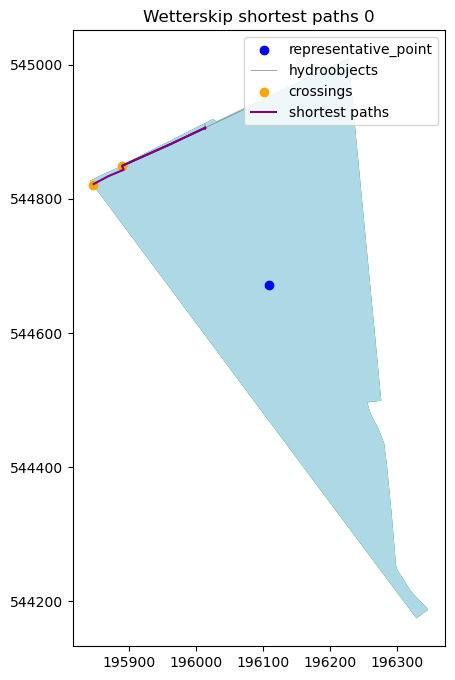

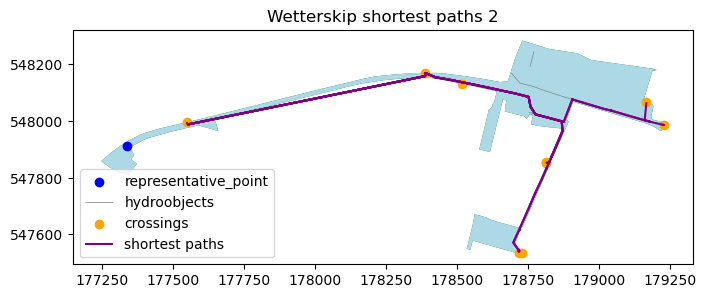

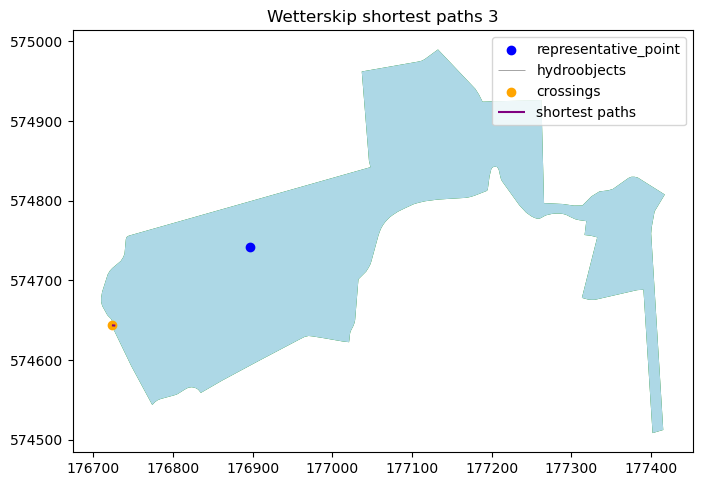

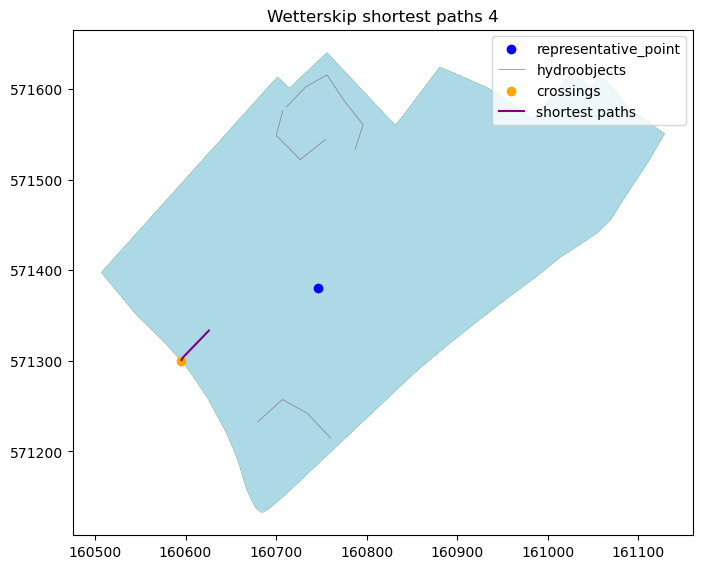

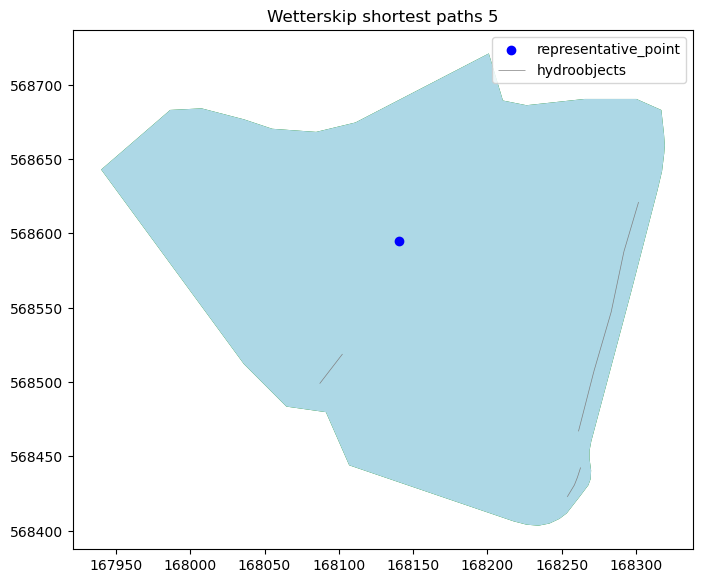

...

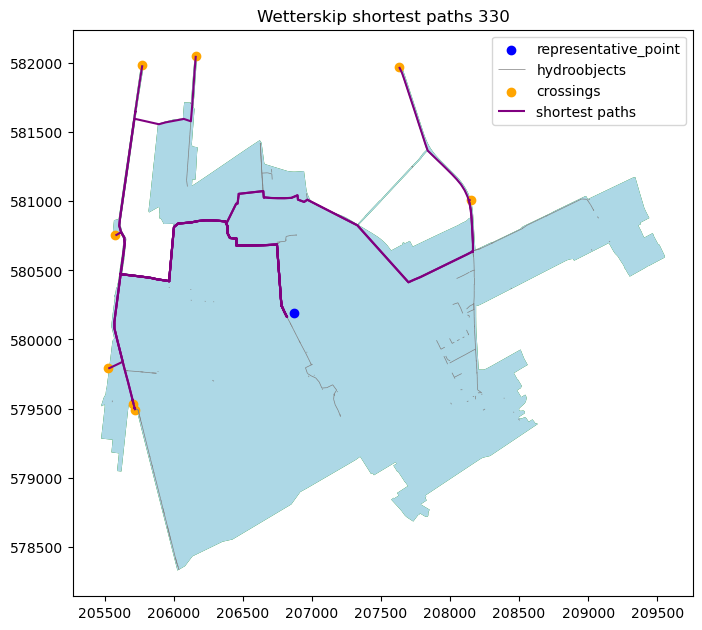

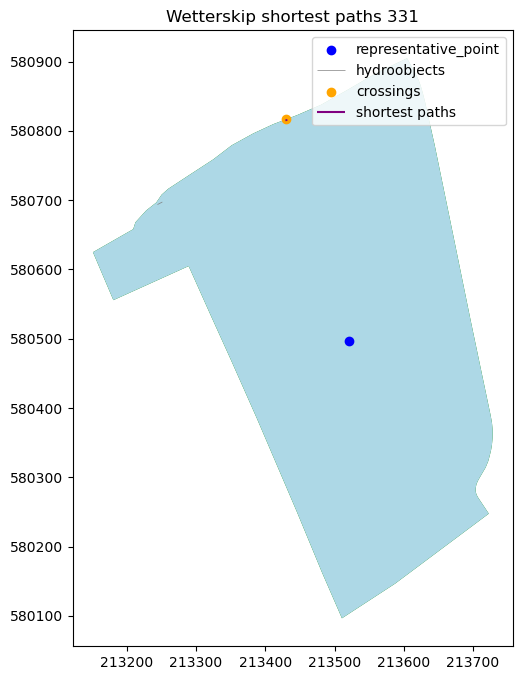

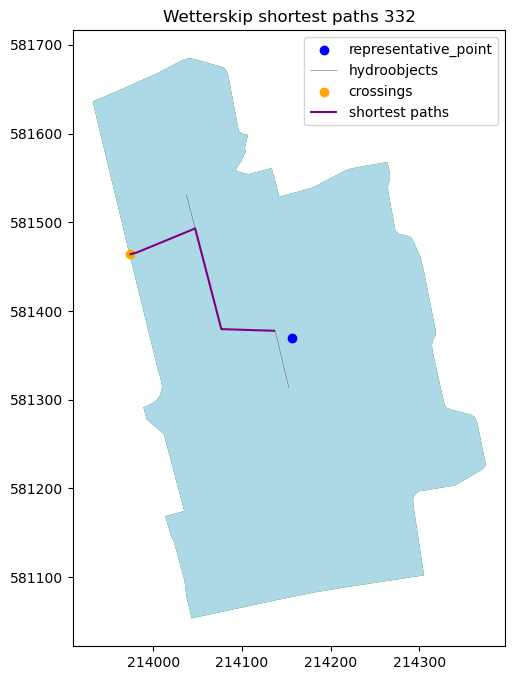

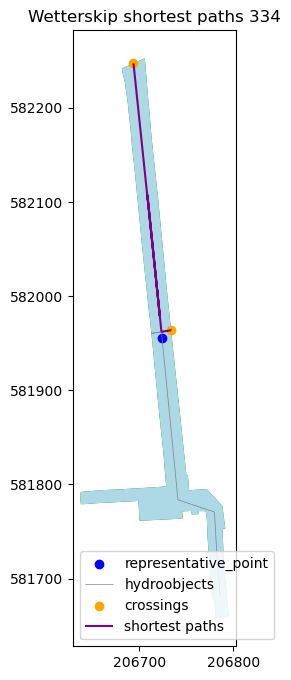

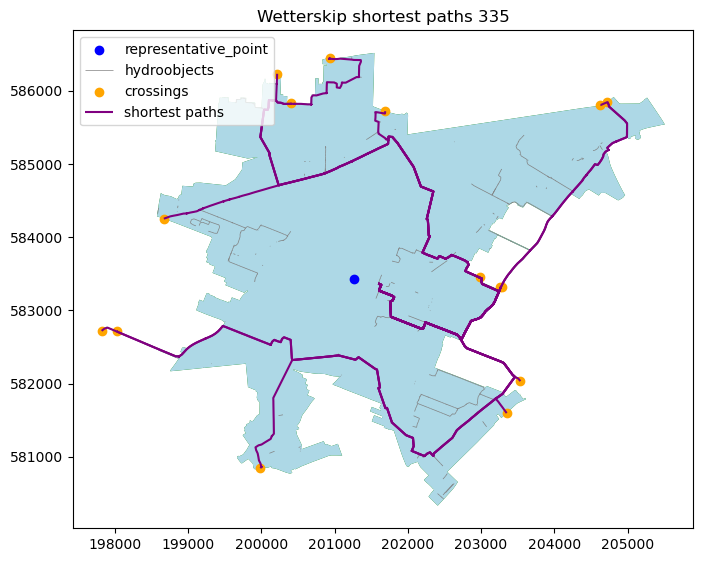

In [17]:
gdf_crossings_out = []
gdf_rhws = gdf_rhws.reset_index(drop=True)

# Loop RHWS polygons
gdf_crossings_out = []


for index, rhws in tqdm.tqdm(gdf_rhws.iterrows(), total=len(gdf_rhws), colour="blue"):
    try:
        print(index)

        ### Select Crossings/Hydroobjects ###
        print("Select Crossings/Hydroobjects")

        # Single RHWS row as GeoDataFrame
        gdf_rhws_single = gpd.GeoDataFrame(rhws.to_frame().T, geometry="geometry", crs=gdf_rhws.crs)

        # Select for each boezem polygon the relevant crossings
        globalid_value = gdf_rhws_single.globalid.iloc[0]
        gdf_cross_single = gdf_cross[
            (gdf_cross.peilgebied_from == globalid_value) | (gdf_cross.peilgebied_to == globalid_value)
        ].copy()
        print("Clip Crossings/Hydroobjects")
        # Select hydroobjects in RHWS polygons
        gdf_object = gpd.clip(DATA["hydroobject"], gdf_rhws_single)
        gdf_object = gdf_object.reset_index(drop=True)

        # Explode linestrings
        gdf_object = gdf_object.explode(index_parts=False).reset_index(drop=True)
        gdf_object = gdf_object[~gdf_object.is_empty].copy()
        gdf_object = gdf_object[gdf_object.length > 1e-7].copy()
        print("Split Hydroobjects at Intersect")
        # Split lines at intersection
        gdf_object = split_lines_at_intersections(gdf_object)

        print("Connect Hydroobjects within distance")
        # Explode the linestrings into smaller segments
        distance_interval = 50  # The distance interval you want to segment the lines at
        gdf_object = explode_linestrings(gdf_object, distance_interval)

        # Make sure that hydroobjects are connected
        gdf_object = connect_linestrings_within_distance(gdf_object)

        # Explode linestrings
        gdf_object = gdf_object.explode(index_parts=False).reset_index(drop=True)
        gdf_object = gdf_object[~gdf_object.is_empty].copy()
        gdf_object = gdf_object[gdf_object.length > 1e-7].copy()

        ### Create NetworkX nodes ###
        print("Create NetworkX")
        # Use start and end points from hydroobjects in networkx as nodes
        nodes_gdf = gdf_object.copy()
        nodes_gdf["geometry"] = nodes_gdf.geometry.boundary
        nodes_gdf = nodes_gdf.explode(index_parts=True)

        # Use the unique points as nodes in networkx
        nodes_gdf.insert(0, "node_id", -1)
        node_id = 1
        for geom, group in nodes_gdf.groupby("geometry"):
            nodes_gdf.loc[group.index, "node_id"] = node_id
            node_id += 1

        ### Select startpoints & endpoints RHWS network ###
        # Find the closest starting points from the crossings.
        # Keep only points which are (almost) equal to the crossings.
        startpoints, distances = nodes_gdf.sindex.nearest(
            gdf_cross_single.geometry, return_all=False, return_distance=True
        )
        startpoints = nodes_gdf.node_id.iloc[startpoints[1, :]].values

        gdf_cross_single["node_id"] = startpoints
        gdf_cross_single["node_id_distance"] = distances

        # find the node_id closest to the RHWS representative point (end point)
        # Exclude the points which are already used as starting points
        df_endpoint = nodes_gdf[~nodes_gdf.node_id.isin(gdf_cross_single.node_id)].copy()
        endpoint, distance = df_endpoint.sindex.nearest(
            rhws.representative_point, return_all=False, return_distance=True
        )

        endpoint = df_endpoint.node_id.iat[endpoint[1, 0]]
        gdf_rhws_single["node_id"] = endpoint
        gdf_rhws_single["node_id_distance"] = distance

        ### Create networkx graph ###
        graph = nx.Graph()

        # add nodes in boezem
        for node_id, group in nodes_gdf.groupby("node_id"):
            graph.add_node(node_id, geometry=group.geometry.iat[0])

        # add edges
        line_lookup = gdf_object.geometry
        for idx0, group in nodes_gdf.groupby(level=0):
            node_from, node_to = group.node_id
            line_geom = gdf_object.geometry.at[idx0]
            graph.add_edge(node_from, node_to, length=line_geom.length, geometry=line_geom)

        ### Find distruptions Graph ###
        # The graph often consists of multiple smaller graphs due to edges not properly connecting with nodes
        # Get lists of compnents (sub-graph)
        print("Find distruptions in Graph")
        components = list(nx.connected_components(graph))
        largest_component = max(components, key=len)
        smaller_components = [comp for comp in components if comp != largest_component]  # not used anymore
        print(len(smaller_components), end="\r")

        while True:
            components = list(nx.connected_components(graph))
            largest_component = max(components, key=len)
            smaller_components = [comp for comp in components if comp != largest_component]

            if not smaller_components:  # If there are no smaller components left, break the loop
                break

            print(len(smaller_components), end="\r")
            # Update node geometries and largest_gdf for each iteration
            node_geometries = {node: graph.nodes[node]["geometry"] for node in graph.nodes()}
            largest_gdf = component_to_gdf(largest_component, node_geometries)
            smaller_gdfs = [component_to_gdf(comp, node_geometries) for comp in smaller_components]

            # Find the closest smaller_gdf to the largest_gdf
            closest_index, (node_in_largest, node_in_smaller) = find_closest_component_pair(largest_gdf, smaller_gdfs)

            # Connect the closest nodes
            connect_components(graph, node_in_largest, node_in_smaller, node_geometries)

        # calculate shortest_path networkx
        gdf_cross_single["shortest_path"] = shapely.geometry.GeometryCollection()
        not_connected = []

        components = list(nx.connected_components(graph))
        largest_component = max(components, key=len)
        smaller_components = [comp for comp in components if comp != largest_component]
        node_geometries = {node: graph.nodes[node]["geometry"] for node in graph.nodes()}

        for startpoint in startpoints:
            try:
                shortest_path = nx.shortest_path(
                    graph, source=startpoint, target=endpoint, weight="length", method="dijkstra"
                )
                edges = []
                for i in range(0, len(shortest_path) - 1):
                    edges.append(graph.get_edge_data(shortest_path[i], shortest_path[i + 1])["geometry"])
                gdf_cross_single.loc[gdf_cross_single.node_id == startpoint, "shortest_path"] = shapely.ops.linemerge(
                    edges
                )

            except nx.NetworkXNoPath as e:
                print(e)
                not_connected.append(startpoint)

        if not_connected:
            print("not connected")
            # Force connection
            # Convert the largest connected component to a GeoDataFrame for spatial operations
            largest_component_gdf = gpd.GeoDataFrame(
                geometry=[node_geometries[node] for node in largest_component], crs=gdf_rhws.crs
            )
            largest_component_gdf["node_id"] = list(largest_component)

            # Iterate over each not_connected node
            for nc_node in not_connected:
                nc_node_geom = node_geometries[nc_node]

                # Calculate the distance to all nodes in the largest component
                distances = largest_component_gdf.geometry.distance(nc_node_geom)

                # Find the closest node in the largest component
                closest_node_id = largest_component_gdf.iloc[distances.idxmin()].node_id

                # Add edge between not_connected node and closest node in the largest component
                # Note: You might want to calculate the LineString geometry connecting these nodes based on your specific requirements
                graph.add_edge(
                    nc_node,
                    closest_node_id,
                    geometry=LineString([node_geometries[nc_node], node_geometries[closest_node_id]]),
                )

            for startpoint in startpoints:
                try:
                    shortest_path = nx.shortest_path(
                        graph, source=startpoint, target=endpoint, weight="length", method="dijkstra"
                    )
                    edges = []
                    for i in range(0, len(shortest_path) - 1):
                        edges.append(graph.get_edge_data(shortest_path[i], shortest_path[i + 1])["geometry"])
                    gdf_cross_single.loc[gdf_cross_single.node_id == startpoint, "shortest_path"] = (
                        shapely.ops.linemerge(edges)
                    )

                except nx.NetworkXNoPath as e:
                    print(e)
                    not_connected.append(startpoint)

        ### Append output ###
        gdf_crossings_out.append(gdf_cross_single)

        ### Plot graph ###
        print("Plotting Output")
        fig, ax = plt.subplots(figsize=(8, 8))
        plt_paths = gpd.GeoDataFrame(gdf_cross_single, geometry="shortest_path", crs=gdf_cross_single.crs)
        plt_rep = gpd.GeoDataFrame(gdf_rhws_single, geometry="representative_point", crs=gdf_rhws_single.crs)
        plt_rhws = gpd.GeoDataFrame(gdf_rhws_single, geometry="geometry", crs=gdf_rhws_single.crs)
        ax.set_title(f"{waterschap} shortest paths {index}")
        plt_rhws.plot(ax=ax, color="green")
        gdf_rhws_single.plot(ax=ax, color="lightblue")
        plt_rep.plot(ax=ax, color="blue", label="representative_point")
        gdf_object.plot(ax=ax, color="gray", linewidth=0.5, label="hydroobjects")
        gdf_cross_single.plot(ax=ax, color="orange", label="crossings")
        plt_paths.plot(ax=ax, color="purple", label="shortest paths")
        ax.legend()
        plt.savefig(f"./shortest_path/Figures/shortest_path_{waterschap}_RHWS_{index}_new", dpi=300)

        # Save results
        print("Writing Output")
        objects = {}
        objects["hydroobjects"] = gpd.GeoDataFrame(gdf_object, geometry="geometry", crs=gdf_cross_single.crs)
        shortest_path = gdf_cross_single.drop(columns=["geometry"])
        shortest_path = shortest_path.rename(columns={"shortest_path": "geometry"})
        shortest_path = gpd.GeoDataFrame(shortest_path, geometry="geometry", crs=gdf_cross_single.crs)
        shortest_path["geometry"] = shortest_path.apply(
            lambda r: shapely.simplify(r.geometry, tolerance=1, preserve_topology=True), axis=1
        )

        objects["shortest_path"] = shortest_path
        objects["rhws"] = gpd.GeoDataFrame(gdf_rhws_single, geometry="geometry", crs=gdf_rhws_single.crs).drop(
            columns=["representative_point"]
        )
        objects["crossings"] = gdf_cross_single.drop(columns=["shortest_path"])
        objects["representative_point"] = gpd.GeoDataFrame(
            gdf_rhws_single, geometry="representative_point", crs=gdf_rhws_single.crs
        ).drop(columns=["geometry"])
        objects["nodes"] = gpd.GeoDataFrame(nodes_gdf, geometry="geometry", crs=gdf_cross_single.crs)

        for key, value in objects.items():
            # For each GeoDataFrame, save it to a layer in the GeoPackage
            value.to_file(
                f"./shortest_path/Geopackages/{waterschap}_unconnected_{index}.gpkg", layer=key, driver="GPKG"
            )
    except Exception as e:
        print(e)

# Write final output
gdf_out = gpd.GeoDataFrame(pd.concat(gdf_crossings_out))
gdf_out["shortest_path"] = gdf_out["shortest_path"].apply(lambda geom: dumps(geom) if geom is not None else None)
gdf_out.to_file(
    f"/DATAFOLDER/projects/4750_30/Data_shortest_path/{waterschap}/{waterschap}_shortest_path.gpkg", driver="GPKG"
)